# 3. VIA Tutorial

This notebook uses VIA to interpret the CD34 Hematopoiesis dataset (Setty et al.,2019) 

In [ ]:
import pyVIA.core as via
import pyVIA.datasets_via as   datasets
import pandas as pd 
import scanpy as sc

import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

/home/shobi/anaconda3/envs/ViaEnv/lib/python3.7/site-packages/phate/__init__.py


## Load data from directory
We use annotations given by SingleR which uses Novershtern Hematopoietic cell data as the reference. These are in line with the annotations given by Setty et al., 2019 but offer a slightly more granular annotation.

In [2]:
adata = datasets.scRNA_hematopoiesis()
sc.tl.pca(adata, svd_solver='arpack', n_comps=200)
tsnem = adata.obsm['tsne']
adata

Cell type pDC has  204 cells
Cell type CMP has  968 cells
Cell type MONO2 has  35 cells
Cell type MONO1 has  186 cells
Cell type MEP has  339 cells
Cell type B_a2 has  1 cells
Cell type GMP has  28 cells
Cell type ERY4 has  53 cells
Cell type BASO1 has  2 cells
Cell type TCEL7 has  1 cells
Cell type mDC (cDC) has  96 cells
Cell type PRE_B3 has  2 cells
Cell type ERY1 has  773 cells
Cell type GRAN1 has  3 cells
Cell type B_a4 has  8 cells
Cell type B_a1 has  27 cells
Cell type HSC1 has  2365 cells
Cell type Nka3 has  5 cells
Cell type ERY2 has  40 cells
Cell type HSC2 has  10 cells
Cell type EOS2 has  3 cells
Cell type ERY3 has  104 cells
Cell type PRE_B2 has  515 cells
Cell type MEGA1 has  12 cells


AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'label'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'pca'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_pca'
    varm: 'PCs'

## User's choice of embedding
Three embedding exmaples: TSNE, UMAP, and PHATE 
Alternatively allow via.VIA() to compute an embedding using the underlying graph by setting: do_embedding = True AND embedding_type = 'via-umap' OR 'via-mds'

In [3]:
# TSNE - same as the embedding used in the original Setty et al., publication
embedding = adata.obsm['tsne']

# # UMAP
# ncomp = 30
# embedding = umap.UMAP().fit_transform(adata.obsm['X_pca'][:, 0:ncomp])

# # PHATE
# ncomp = 30
# phate_op = phate.PHATE()
# embedding = phate_op.fit_transform(adata.obsm['X_pca'][:, 0:ncomp])

## Run VIA
#### Key Parameters:
- knn
- dataset
- root_user
- jac_std_global
- too_big_factor
- cluster_graph_pruning
- embedding (optional) can be run without an embedding, can prompt via to compute an embedding, or provide an embedding later directly to the plotting functions

2023-02-22 09:52:19.993548	Running VIA over input data of 5780 (samples) x 80 (features)
2023-02-22 09:52:19.994732	Knngraph has 30 neighbors


2023-02-22 09:52:23.603860	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 46.3 % of edges. 
2023-02-22 09:52:23.638383	Number of connected components used for clustergraph  is 1


2023-02-22 09:52:23.957462	Commencing community detection


2023-02-22 09:52:24.274937	Finished running Leiden algorithm. Found 207 clusters.
2023-02-22 09:52:24.276897	Merging 188 very small clusters (<10)
2023-02-22 09:52:24.280016	Finished detecting communities. Found 19 communities
2023-02-22 09:52:24.280437	Making cluster graph. Global cluster graph pruning level: 0.15
2023-02-22 09:52:24.300651	Graph has 1 connected components before pruning
2023-02-22 09:52:24.302763	Graph has 2 connected components after pruning
2023-02-22 09:52:24.304172	Graph has 1 connected components after reconnecting
2023-02-22 09:52:24.304852	0.0% links trimmed from local pruning relative to start
2023-02-22 09:52:24.304900	65.5% links trimmed from global pruning relative to start
2023-02-22 09:52:24.307652	Starting make edgebundle viagraph...
2023-02-22 09:52:24.307700	Make via clustergraph edgebundle


2023-02-22 09:52:25.968285	Hammer dims: Nodes shape: (19, 2) Edges shape: (76, 3)
component number 0 out of  [0]
2023-02-22 09:52:25.984718	The root index, 4823 provided by the user belongs to cluster number 1 and corresponds to cell type HSC1
2023-02-22 09:52:25.986711	Computing lazy-teleporting expected hitting times


2023-02-22 09:52:26.835668	Identifying terminal clusters corresponding to unique lineages...
2023-02-22 09:52:26.835868	Closeness:[2, 4, 6, 7, 10, 12, 15]
2023-02-22 09:52:26.835897	Betweenness:[1, 2, 4, 5, 6, 7, 10, 12, 13, 14, 15, 17]
2023-02-22 09:52:26.835917	Out Degree:[2, 4, 5, 6, 7, 8, 9, 10, 12, 14, 15, 16, 17]
2023-02-22 09:52:26.836855	Cluster 7 had 3 or more neighboring terminal states [6, 10, 15] and so we removed cluster 6
2023-02-22 09:52:26.837421	Terminal clusters corresponding to unique lineages in this component are [2, 4, 5, 7, 10, 12, 14, 15, 17] 


2023-02-22 09:52:27.185401	From root 1,  the Terminal state 2 is reached 6 times.


2023-02-22 09:52:27.550917	From root 1,  the Terminal state 4 is reached 175 times.


2023-02-22 09:52:27.893829	From root 1,  the Terminal state 5 is reached 285 times.


2023-02-22 09:52:28.315495	From root 1,  the Terminal state 7 is reached 48 times.


2023-02-22 09:52:28.687507	From root 1,  the Terminal state 10 is reached 54 times.


2023-02-22 09:52:29.033676	From root 1,  the Terminal state 12 is reached 223 times.


2023-02-22 09:52:29.318236	From root 1,  the Terminal state 14 is reached 470 times.


2023-02-22 09:52:29.775149	From root 1,  the Terminal state 15 is reached 17 times.


2023-02-22 09:52:30.033120	From root 1,  the Terminal state 17 is reached 480 times.
2023-02-22 09:52:30.059057	Terminal clusters corresponding to unique lineages are {2: 'PRE_B2', 4: 'CMP', 5: 'HSC1', 7: 'ERY1', 10: 'ERY3', 12: 'MONO1', 14: 'pDC', 15: 'ERY1', 17: 'pDC'}
2023-02-22 09:52:30.059154	Begin projection of pseudotime and lineage likelihood


2023-02-22 09:52:31.324600	Graph has 1 connected components before pruning
2023-02-22 09:52:31.326678	Graph has 6 connected components after pruning
2023-02-22 09:52:31.330508	Graph has 1 connected components after reconnecting
2023-02-22 09:52:31.331100	52.6% links trimmed from local pruning relative to start
2023-02-22 09:52:31.331149	61.8% links trimmed from global pruning relative to start
2023-02-22 09:52:31.333523	Start making edgebundle milestone...
2023-02-22 09:52:31.333871	Start finding milestones


2023-02-22 09:52:41.534482	End milestones
2023-02-22 09:52:41.536940	Will use via-pseudotime for edges, otherwise consider providing a list of numeric labels (single cell level) or via_object
2023-02-22 09:52:41.571452	Recompute weights
2023-02-22 09:52:41.598362	pruning milestone graph based on recomputed weights
2023-02-22 09:52:41.599856	Graph has 1 connected components before pruning
2023-02-22 09:52:41.600852	Graph has 1 connected components after pruning
2023-02-22 09:52:41.601185	Graph has 1 connected components after reconnecting
2023-02-22 09:52:41.602393	68.8% links trimmed from global pruning relative to start
2023-02-22 09:52:41.602460	regenerate igraph on pruned edges
2023-02-22 09:52:41.611488	Setting numeric label as single cell pseudotime for coloring edges
2023-02-22 09:52:41.630874	Making smooth edges


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


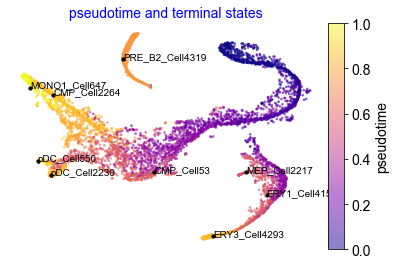

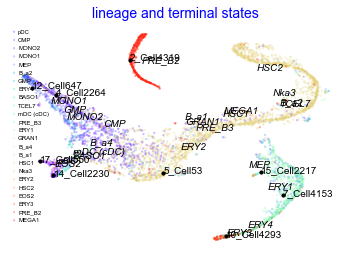

2023-02-22 09:52:44.395670	Time elapsed 23.2 seconds


In [4]:
ncomps=80
knn=30
v0_random_seed=4
root_user = [4823] #the index of a cell belonging to the HSC cell type
dataset = ''

'''
#NOTE1, if you decide to choose a cell type as a root, then you need to set the dataset as 'group'
#root_user=['HSC1']
#dataset = 'group'# 'humanCD34'
#NOTE2, if rna-velocity is available, considering using it to compute the root automatically- see RNA velocity tutorial
'''

v0 = via.VIA(data=adata.obsm['X_pca'][:, 0:ncomps], true_label=adata.obs['label'], 
             jac_std_global=0.15, cluster_graph_pruning_std=0.15,
             knn=knn, too_big_factor=0.3, root_user=root_user, 
             dataset=dataset, random_seed=v0_random_seed, embedding = embedding)

v0.run_VIA()

#NOTE2: if you want to pre-specify terminal states you can do so by a list of group-level names corresponding to true-labels OR by a list of single cell indices
#E.G. user_defined_terminal_group=['pDC','ERY1', 'ERY3', 'MONO1','mDC (cDC)','PRE_B2']

## Cluster Level Trajectory Plots

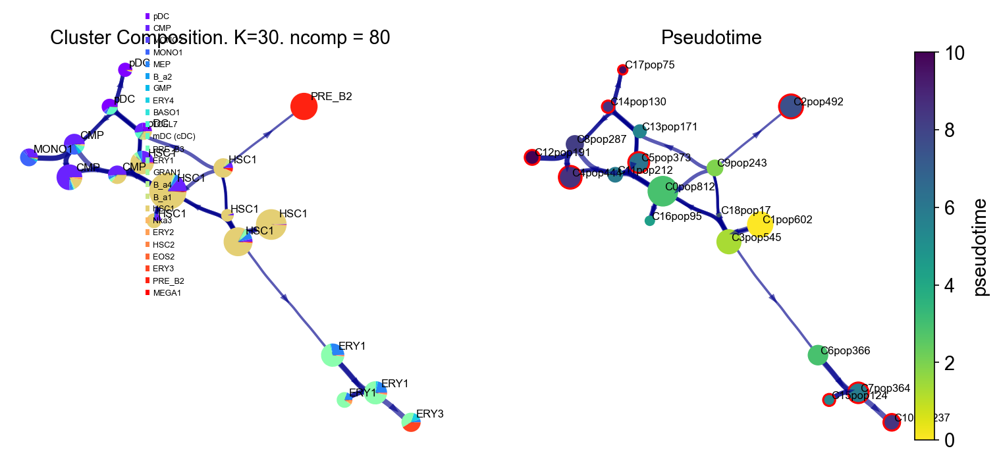

In [6]:
fig, ax, ax1 = via.draw_piechart_graph(via_object=v0)
fig.set_size_inches(12,5)

## Visualise gene/feature graph
View the gene expression along the VIA graph. We use the computed HNSW small world graph in VIA to accelerate the gene imputation calculations (using similar approach to MAGIC) as follows:
##### Note: df_magic_cluster contains mean cluster-level gene/feature values

shape of transition matrix raised to power 3 (5780, 5780)


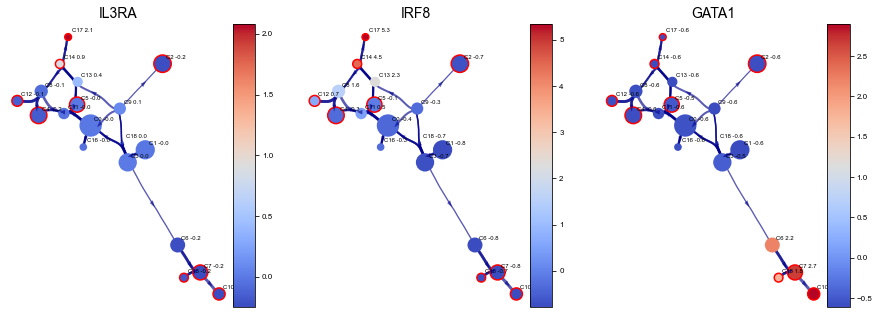

In [7]:
df_ = pd.DataFrame(adata.X)
df_.columns = [i for i in adata.var_names]

gene_list_magic = ['IL3RA', 'IRF8', 'GATA1', 'GATA2', 'ITGA2B', 'MPO', 'CD79B', 'SPI1', 'CD34', 'CSF1R', 'ITGAX']
df_magic = v0.do_impute(df_, magic_steps=3, gene_list=gene_list_magic)
df_magic['parc'] = v0.labels
df_magic_cluster = df_magic.groupby('parc', as_index=True).mean()

fig, axs = via.draw_clustergraph(via_object=v0, type_data='gene', gene_exp=df_magic_cluster, gene_list=gene_list_magic[0:3], arrow_head=0.1)
fig.set_size_inches(15,5)

## Trajectory projection

Visualize the overall VIA trajectory projected onto a 2D embedding (UMAP, Phate, TSNE etc) in different ways. 

1. Draw the high-level clustergraph abstraction onto the embedding;
2. Draws a vector field plot of the more fine-grained directionality of cells along the trajectory projected onto an embedding. 
3. Draw high-edge resolution directed graph

#### Key Parameters:
- scatter_size
- scatter_alpha
- linewidth
- draw_all_curves (if too crowded, set to False)

via fine single cell pt <class 'list'> [   0    1    2 ... 5777 5778 5779]


N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:  00:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:  00:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:  00:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:  00:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:  00:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:  00:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 81% (9 of 11) |####################     | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--

  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:  00:00:00

 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:00

 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00

 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00

 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00

 72% (8 of 11) |##################       | Elapsed Time: 0:00:00 ETA:   0:00:00

 90% (10 of 11) |#####################   | Elapsed Time: 0:00:00 ETA:   0:00:00

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00

2023-02-22 10:05:25.848076	Super cluster 2 is a super terminal with sub_terminal cluster 2
2023-02-22 10:05:25.848457	Super cluster 4 is a super terminal with sub_terminal cluster 4
2023-02-22 10:05:25.848651	Super cluster 5 is a super terminal with sub_terminal cluster 5
2023-02-22 10:05:25.848838	Super cluster 7 is a super terminal with sub_terminal cluster 7
2023-02-22 10:05:25.849062	Super cluster 10 is a super terminal with sub_terminal cluster 10
2023-02-22 10:05:25.849248	Super cluster 12 is a super terminal with sub_terminal cluster 12
2023-02-22 10:05:25.849433	Super cluster 14 is a super terminal with sub_terminal cluster 14
2023-02-22 10:05:25.849616	Super cluster 15 is a super terminal with sub_terminal cluster 15
2023-02-22 10:05:25.849801	Super cluster 17 is a super terminal with sub_terminal cluster 17


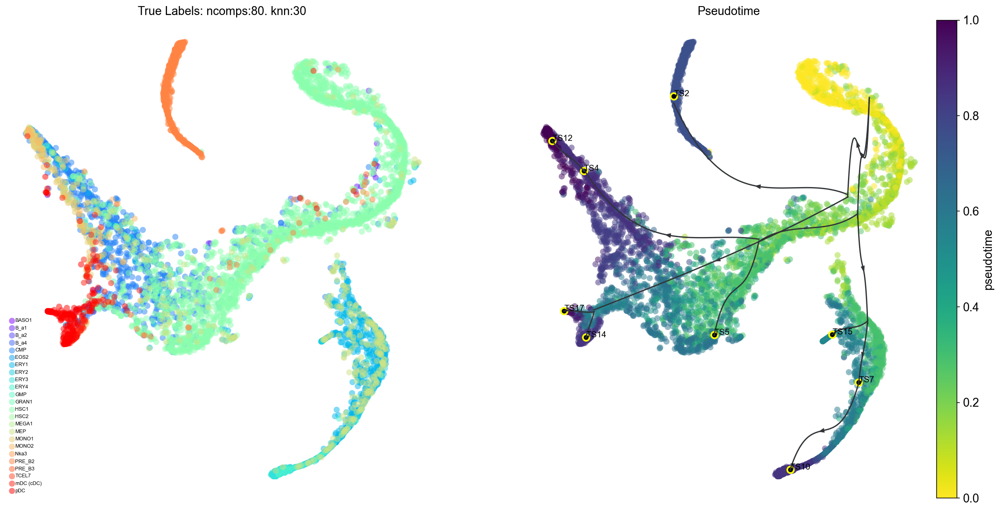

In [16]:
fig, ax, ax1 = via.draw_trajectory_gams(via_object=v0,embedding=tsnem, draw_all_curves=False)

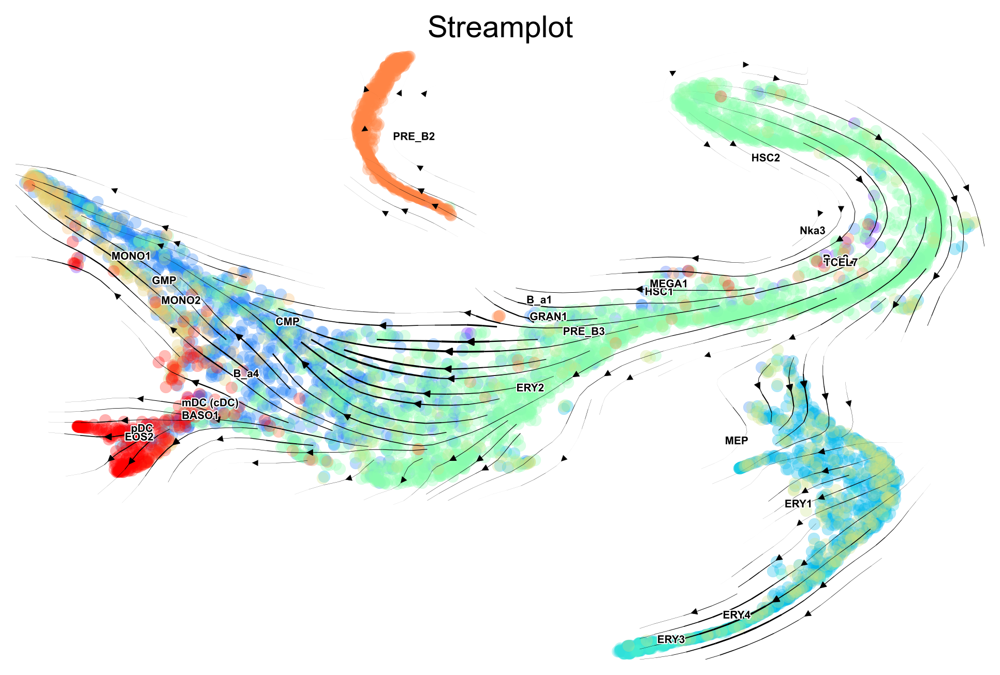

In [17]:
# via_streamplot() requires you to either provide an ndarray as embedding as an input parameter OR for via to have an embedding attribute
fig, ax = via.via_streamplot(v0, embedding, density_grid=0.8, scatter_size=30, scatter_alpha=0.3, linewidth=0.5)
fig.set_size_inches(8,5)

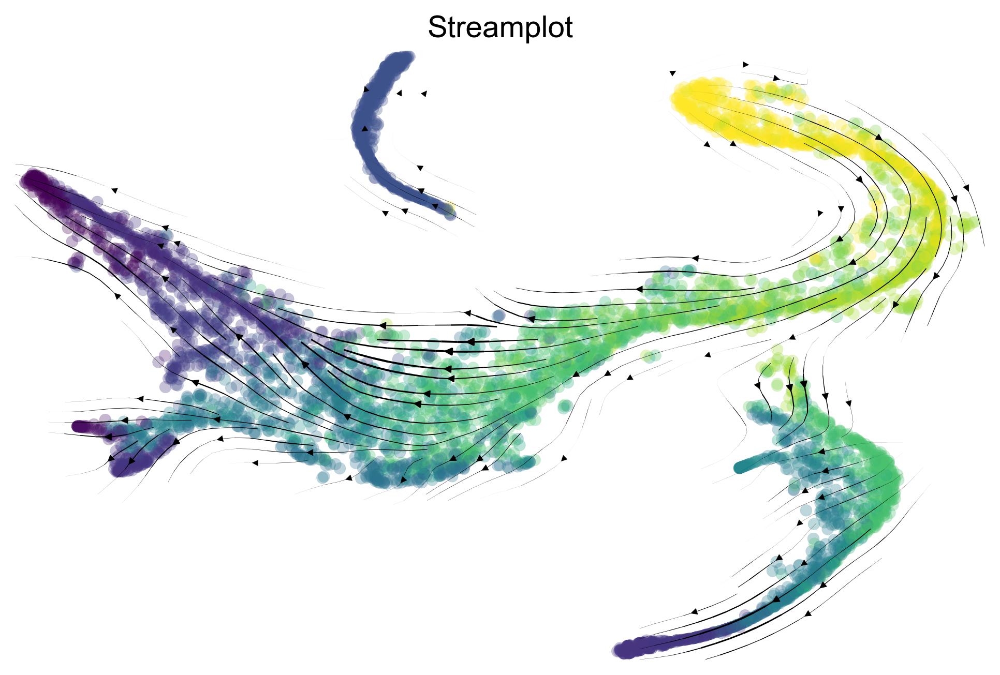

In [18]:
#Colored by pseudotime
v0.embedding = embedding
fig, ax = via.via_streamplot(v0,density_grid=0.8, scatter_size=30, color_scheme='time', linewidth=0.5, 
                             min_mass = 1, cutoff_perc = 5, scatter_alpha=0.3, marker_edgewidth=0.1, 
                             density_stream = 2, smooth_transition=1, smooth_grid=0.5)
fig.set_size_inches(8,5)

## Probabilistic pathways
Visualize the probabilistic pathways from root to terminal state as indicated by the lineage likelihood. The higher the linage likelihood, the greater the potential of that particular cell to differentiate towards the terminal state of interest.

#### Key Parameters:
marker_lineages (list) of terminal clusters

2023-02-22 10:04:25.827409	Marker_lineages: [2, 4, 5, 7, 10, 12, 14, 15, 17]
2023-02-22 10:04:25.833204	The number of components in the original full graph is 1
2023-02-22 10:04:25.833454	For downstream visualization purposes we are also constructing a low knn-graph 


2023-02-22 10:04:30.317452	Check sc pb [0.    0.    0.    0.486 0.243 0.    0.    0.27  0.   ]


2023-02-22 10:04:30.535092	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 2: [1, 3, 0, 9, 2]
2023-02-22 10:04:30.535210	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 4: [1, 3, 0, 4]
2023-02-22 10:04:30.535236	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 5: [1, 3, 0, 11, 5]
2023-02-22 10:04:30.535256	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 7: [1, 3, 6, 7]
2023-02-22 10:04:30.535278	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 10: [1, 3, 6, 7, 10]
2023-02-22 10:04:30.535304	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 12: [1, 3, 0, 4, 12]
2023-02-22 10:04:30.535329	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 14: [1, 3, 0, 9, 13, 14]
2023-02-22 10:04:30.535348	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 15: [1, 3, 6, 15]
2023

2023-02-22 10:04:30.776514	Revised Cluster level path on sc-knnGraph from Root Cluster 1 to Terminal Cluster 5 along path: [1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]
2023-02-22 10:04:30.818912	Revised Cluster level path on sc-knnGraph from Root Cluster 1 to Terminal Cluster 7 along path: [1, 1, 1, 1, 6, 7, 7, 7]
2023-02-22 10:04:30.849282	Revised Cluster level path on sc-knnGraph from Root Cluster 1 to Terminal Cluster 10 along path: [1, 1, 1, 3, 6, 10, 10, 10, 10]
2023-02-22 10:04:30.877187	Revised Cluster level path on sc-knnGraph from Root Cluster 1 to Terminal Cluster 12 along path: [1, 1, 1, 3, 12, 12, 12, 12, 12]
2023-02-22 10:04:30.906603	Revised Cluster level path on sc-knnGraph from Root Cluster 1 to Terminal Cluster 14 along path: [1, 1, 1, 1, 13, 14, 14, 14, 14]
2023-02-22 10:04:30.935083	Revised Cluster level path on sc-knnGraph from Root Cluster 1 to Terminal Cluster 15 along path: [1, 1, 1, 1, 1, 0, 15, 15]
2023-02-22 10:04:30.962277	Revised Cluster level path on sc-knnGraph from 

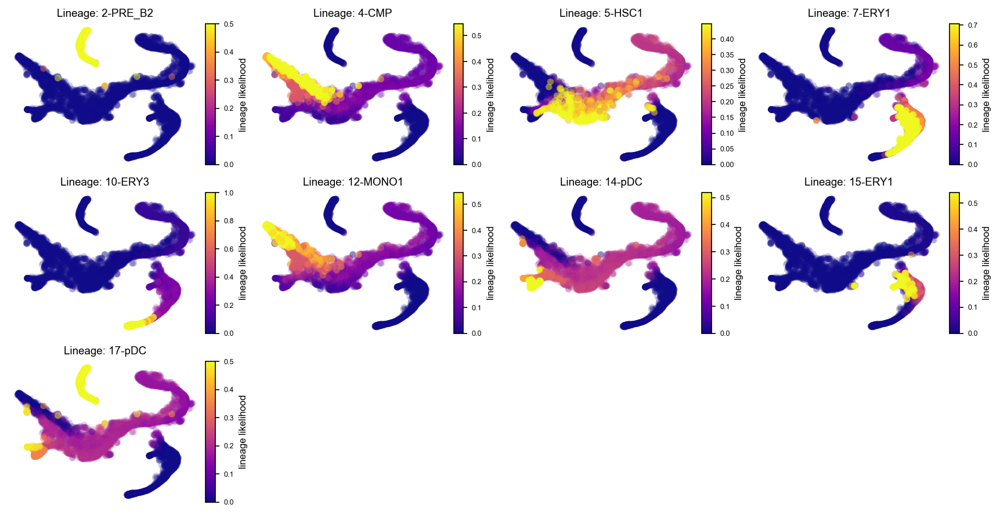

In [12]:
fig, axs= via.draw_sc_lineage_probability(via_object=v0, marker_lineages=v0.terminal_clusters, embedding=tsnem)
fig.set_size_inches(14,7)

2023-02-22 10:04:44.199711	Marker_lineages: [2, 7]
2023-02-22 10:04:44.204741	The number of components in the original full graph is 1
2023-02-22 10:04:44.204817	For downstream visualization purposes we are also constructing a low knn-graph 


2023-02-22 10:04:48.774707	Check sc pb [0.    0.    0.    0.486 0.243 0.    0.    0.27  0.   ]


2023-02-22 10:04:48.976008	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 2: [1, 3, 0, 9, 2]
2023-02-22 10:04:48.976190	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 4: [1, 3, 0, 4]
2023-02-22 10:04:48.976229	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 5: [1, 3, 0, 11, 5]
2023-02-22 10:04:48.976258	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 7: [1, 3, 6, 7]
2023-02-22 10:04:48.976286	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 10: [1, 3, 6, 7, 10]
2023-02-22 10:04:48.976312	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 12: [1, 3, 0, 4, 12]
2023-02-22 10:04:48.976339	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 14: [1, 3, 0, 9, 13, 14]
2023-02-22 10:04:48.976365	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 15: [1, 3, 6, 15]
2023

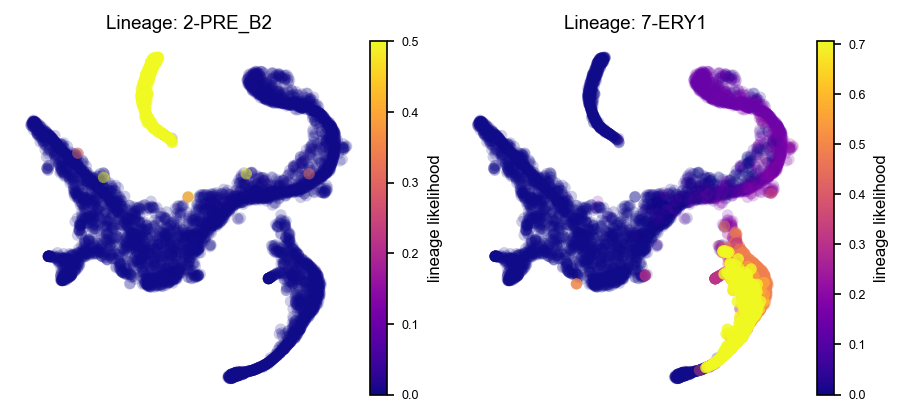

In [14]:
fig, axs= via.draw_sc_lineage_probability(via_object=v0,via_fine= v0, embedding=tsnem, marker_lineages = [2,3,7])
fig.set_size_inches(7,3)

## Gene Dynamics
The gene dynamics along pseudotime for all detected lineages are automatically inferred by VIA. These can be interpreted as the change in gene expression along any given lineage.
#### Key Parameters
- n_splines
- spline_order
- gene_exp (dataframe) single-cell level gene expression of select genes (gene imputation is an optional pre-step)

shape of transition matrix raised to power 3 (5780, 5780)


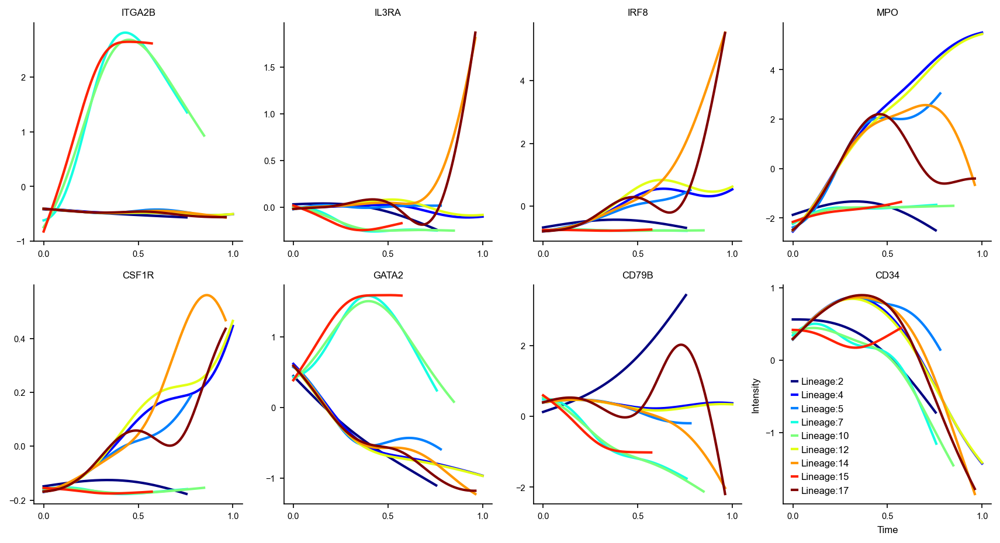

In [15]:
marker_genes =['ITGA2B', 'IL3RA', 'IRF8', 'MPO', 'CSF1R', 'GATA2', 'CD79B', 'CD34']
df = pd.DataFrame(adata.X, columns = adata.var_names)
df_magic = v0.do_impute(df, magic_steps=3, gene_list=gene_list_magic) #optional
fig, axs=via.get_gene_expression(via0=v0, gene_exp=df_magic[marker_genes])
fig.set_size_inches(14,7)

## Gene Dynamics
Heatmaps of genes along pseudotimetime
#### Key Parameters
- df_gene_exp (dataframe) single-cell level gene expression of selected genes
- marker_lineages (list, optional) to specify which lineages to plot heatmaps for

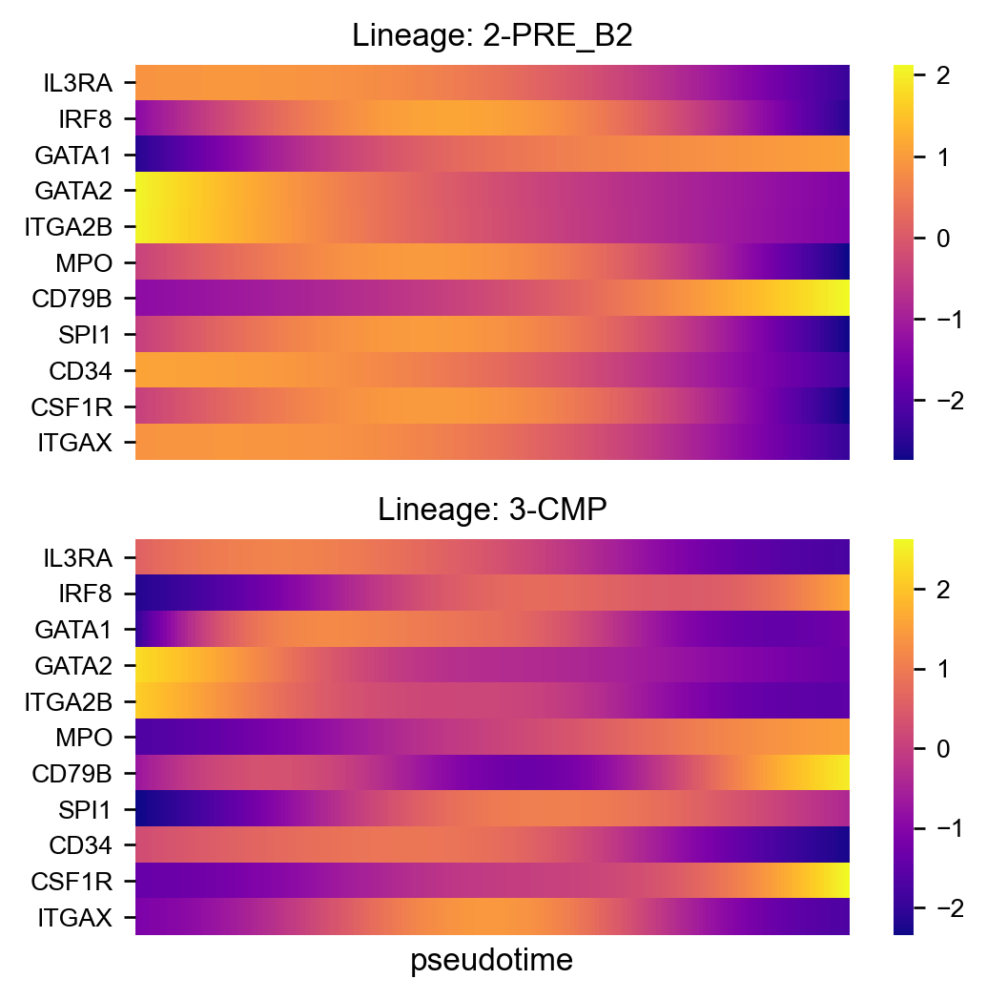

In [11]:
fig, axs = via.plot_gene_trend_heatmaps(via_object=v0, df_gene_exp=df_magic, cmap='plasma',
                             marker_lineages=[2,3])
fig.set_size_inches(5,5)

## Various Visualizations
### Visualizations of the trajectory can be plotted at various edge resolutions

## Edge bundle plot
#### Key Parameters (default):
- alpha_bundle_factor=1
- linewidth_bundle=2
- cmap:str = 'plasma_r'
- size_scatter:int=2
- alpha_scatter:float = 0.2 
- headwidth_bundle=0.1

2023-01-03 09:24:38.570736	Computing Edges
2023-01-03 09:24:38.570852	Start finding milestones
2023-01-03 09:24:47.796023	End milestones
2023-01-03 09:24:47.822500	Recompute weights
2023-01-03 09:24:47.973642	pruning milestone graph based on recomputed weights
2023-01-03 09:24:47.978335	Graph has 1 connected components before pruning
2023-01-03 09:24:47.979170	Graph has 1 connected components before pruning
2023-01-03 09:24:47.986368	regenerate igraph on pruned edges
2023-01-03 09:24:48.040678	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2023-01-03 09:24:48.115835	Making smooth edges
2023-01-03 09:26:23.981005	Finished plot


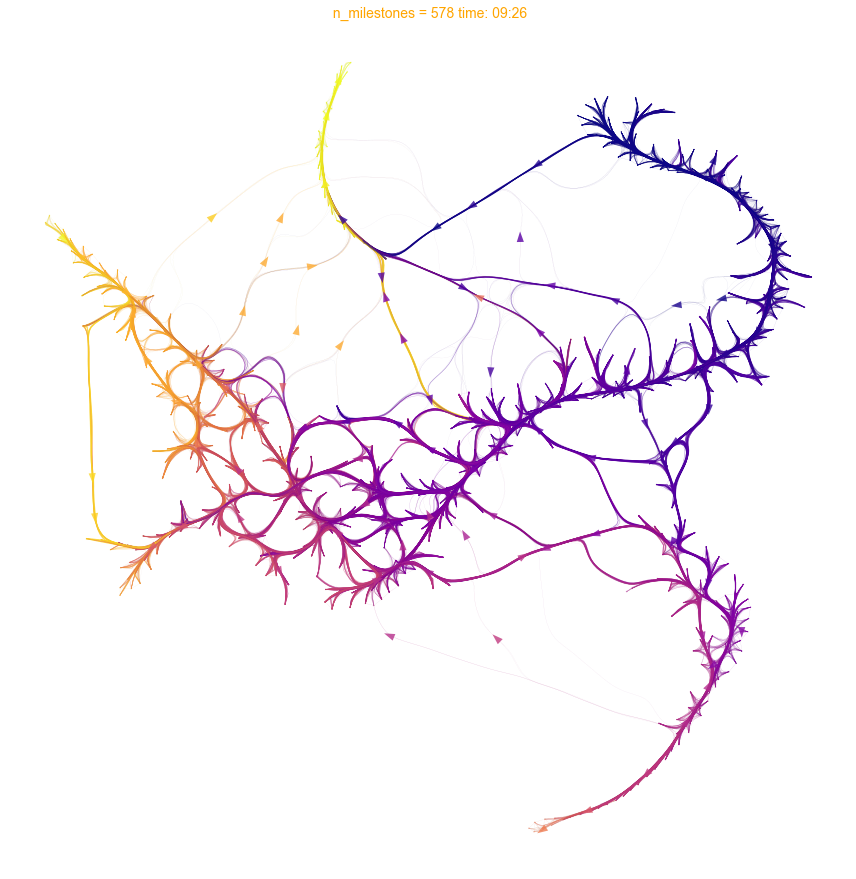

In [14]:
# running plot_edge_bundle() requires that the VIA object has an embedding attribute
v0.embedding = tsnem

fig, ax = via.plot_edge_bundle(via_object=v0, headwidth_bundle=0.5) 
fig.set_size_inches(15,15)

2023-02-22 10:10:46.097510	Start finding milestones


2023-02-22 10:10:59.772387	End milestones
2023-02-22 10:10:59.801752	Recompute weights
2023-02-22 10:10:59.817832	pruning milestone graph based on recomputed weights
2023-02-22 10:10:59.819005	Graph has 1 connected components before pruning
2023-02-22 10:10:59.819849	Graph has 1 connected components after pruning
2023-02-22 10:10:59.820172	Graph has 1 connected components after reconnecting
2023-02-22 10:10:59.821515	regenerate igraph on pruned edges
2023-02-22 10:10:59.831697	Setting numeric label as single cell pseudotime for coloring edges
2023-02-22 10:10:59.849543	Making smooth edges


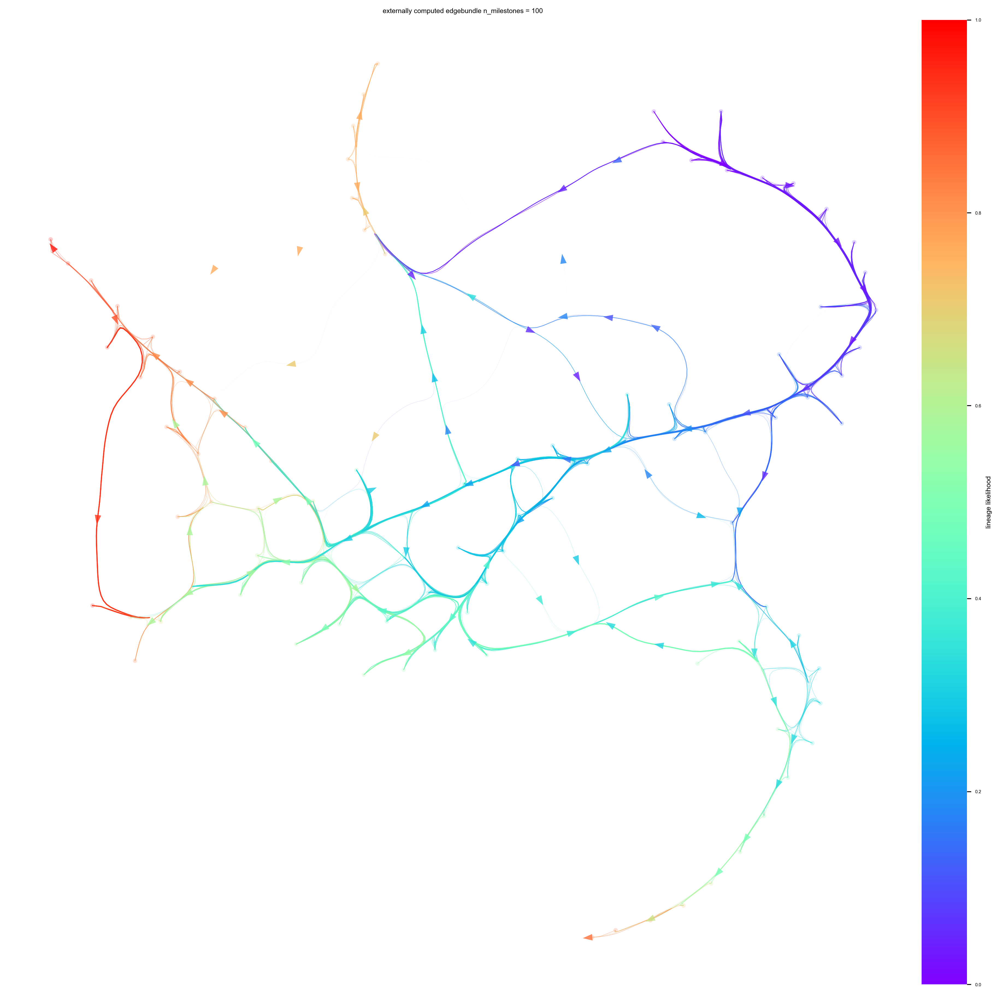

In [20]:
# edge plots can be made with different edge resolutions. Run hammerbundle_milestone_dict() to recompute the edges for plotting. Then provide the new hammerbundle as a parameter to plot_edge_bundle()
hammerbundle_milestone_dict = via.make_edgebundle_milestone(via_object=v0,  n_milestones=100,global_visual_pruning=0.5, decay=0.7, initial_bandwidth=0.05)

fig, ax=via.plot_edge_bundle(hammerbundle_dict=hammerbundle_milestone_dict,
                     linewidth_bundle=1.5, alpha_bundle_factor=2,
                     cmap='rainbow', facecolor='white', size_scatter=15, alpha_scatter=0.2,
                     extra_title_text='externally computed edgebundle', headwidth_bundle=0.4)
fig.set_size_inches(15,15)

## Animated Stream plot

2023-01-03 09:32:23.524989	Inside animated. File will be saved to location /home/shobi/Trajectory/Datasets/HumanCD34/HumanCD34_animation_Jan3.gif


  0%|          | 0/250 [00:00<?, ?it/s]

total number of stream lines 201


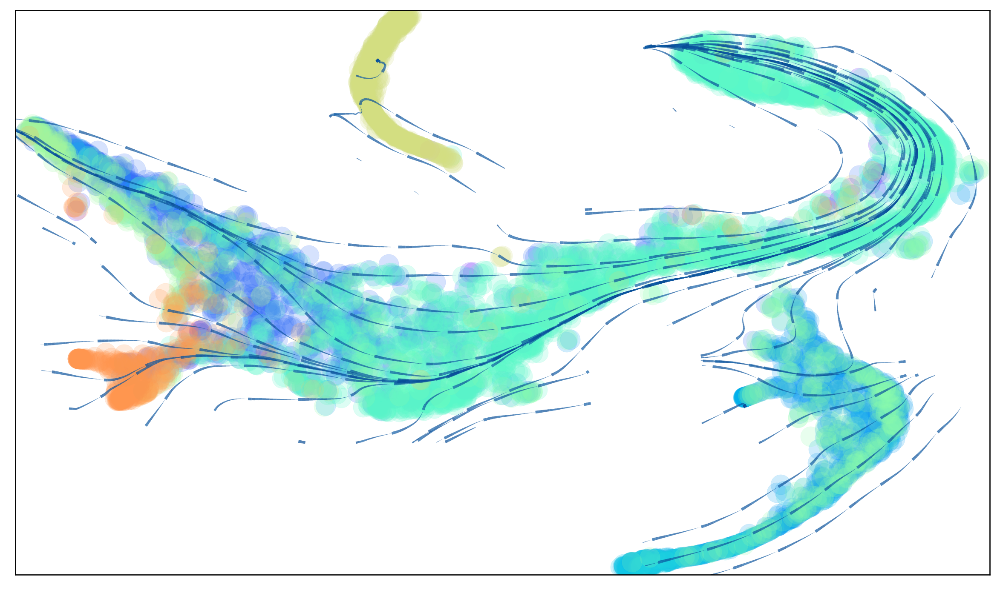

(<Figure size 1200x720 with 1 Axes>, <AxesSubplot:>)

In [16]:
sc.settings.set_figure_params(dpi=120, facecolor='white')
#the streamlines load very slowly through the Notebook, so see the code below to open the file and view the animation properly
via.animated_streamplot(v0, embedding=tsnem, cmap_stream='Blues', scatter_size=200, scatter_alpha=0.2, marker_edgewidth=0.15, 
                        density_grid=0.7, linewidth=0.1, segment_length=1.5, saveto='/home/shobi/Trajectory/Datasets/HumanCD34/HumanCD34_animation_Jan3.gif')

In [14]:
from IPython.display import Image

with open('./Figures/HumanCD34_animation.gif','rb') as file:
    display(Image(file.read()))

## Animated edge bundle plot

making hammerbundle
2022-11-08 16:46:46.082215	Start kmeans milestone
2022-11-08 16:46:50.162267	End kmeans milestone
2022-11-08 16:46:50.230431	Recompute weights
2022-11-08 16:46:50.348908	pruning milestone graph based on recomputed weights
2022-11-08 16:46:50.358479	Graph has 1 connected components before pruning
2022-11-08 16:46:50.358479	Graph has 1 connected components before pruning
2022-11-08 16:46:50.368028	regenerate igraph on pruned edges
2022-11-08 16:46:50.456737	make node dataframe
2022-11-08 16:46:50.472879	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2022-11-08 16:46:50.592365	Hammer bundling
seg weight 0.1311759587041706


MovieWriter imagemagick unavailable; using Pillow instead.


2022-11-08 16:47:46.937861	Finished plotting edge bundle
times series order set [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
number cycles if no time_series labels given 40.0
complete animate
inside update 0 out of 120
inside update 0 out of 120
inside update 1 out of 120
inside update 2 out of 120
inside update 3 out of 120
inside update 4 out of 120
inside update 5 out of 120
inside update 6 out of 120
inside update 7 out of 120
inside update 8 out of 120
inside update 9 out of 120
inside update 10 out of 120
inside update 11 out of 120
inside update 12 out of 120
inside update 13 out of 120
inside update 14 out of 120
inside update 15 out of 120
inside update 16 out of 120
inside update 17 out of 120
inside update 18 out of 120
inside update 19 out of 120
inside update 20 out of 120
inside update 21 out of 120
inside update 22 out of 120
inside update 23 out of 120
inside update 24 out of 120
inside update 25 out of 120
inside update 26 out of 120
inside update 27 out of 120
inside update 28 

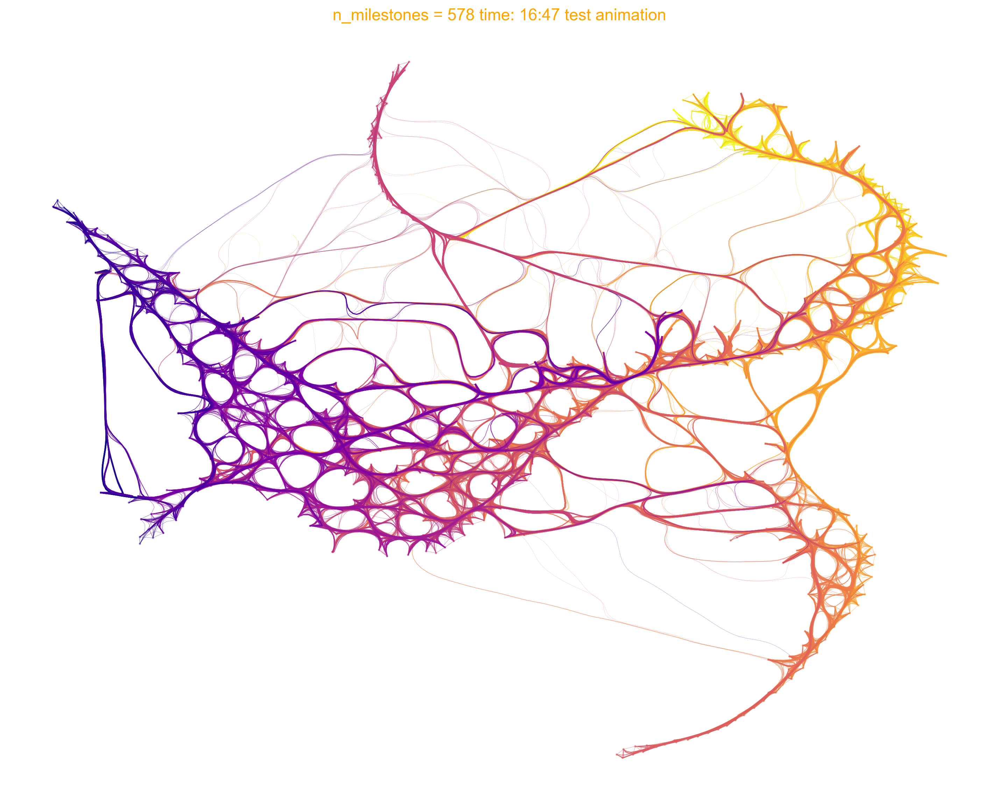

In [ ]:
via.animate_edge_bundle(via_object=v0, extra_title_text='test animation', n_milestones=None,
                        saveto='./Figures/human_edgebundle_test.gif')

In [ ]:
from IPython.display import Image
with open('./Figures/human_edgebundle_test.gif','rb') as file:
    display(Image(file.read()))